#Context
###The Bureau of Transportation Statistics (BTS) Border Crossing Data provide summary statistics for inbound crossings at the U.S.-Canada and the U.S.-Mexico border at the port level. Data are available for trucks, trains, containers, buses, personal vehicles, passengers, and pedestrians. Border crossing data are collected at ports of entry by U.S. Customs and Border Protection (CBP). The data reflect the number of vehicles, containers, passengers or pedestrians entering the United States. CBP does not collect comparable data on outbound crossings. Users seeking data on outbound counts may therefore want to review data from individual bridge operators, border state governments, or the Mexican and Canadian governments.



#COVERAGE: 
###Incoming vehicle, container, passenger, and pedestrian counts at U.S.-Mexico and U.S.-Canada land border ports.

#Variables:
##Port Name : Name of CBP Port of Entry
##State : State Name
##Port Code : CBP Port Code
##Border : US-Canada Border or US-Mexico Border
##Date : DDMMYYYY - Monthly Data
##Measure : Conveyances, containers, passengers, pedestrians
##Values : Count of people

###Importing necessary libraries

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


###Uploading Data

In [ ]:
from google.colab import files 
files.upload()

Saving Border Crossing Entry Data.xlsx to Border Crossing Entry Data.xlsx


{'Border Crossing Entry Data.xlsx': b'PK\x03\x04\x14\x00\x06\x00\x08\x00\x00\x00!\x00b\xee\x9dh^\x01\x00\x00\x90\x04\x00\x00\x13\x00\x08\x02[Content_Types].xml \xa2\x04\x02(\xa0\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

###Creating Dataframe

In [ ]:
border_data = pd.read_excel("Border Crossing Entry Data.xlsx",header=0)

In [ ]:
border_data.head()

,Port Name,State,Port Code,Border,Date,Measure,Value
0,Alexandria Bay,NY,708,US-Canada Border,2019-12-01,Bus Passengers,740
1,Baudette,MN,3424,US-Canada Border,2019-12-01,Bus Passengers,83
2,Blaine,WA,3004,US-Canada Border,2019-12-01,Bus Passengers,17029
3,Brownsville,TX,2301,US-Mexico Border,2019-12-01,Bus Passengers,4668
4,Buffalo-Niagara Falls,NY,901,US-Canada Border,2019-12-01,Bus Passengers,9910


In [ ]:
border_data.shape

(106102, 7)

In [ ]:
border_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106102 entries, 0 to 106101
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Port Name  106102 non-null  object        
 1   State      106102 non-null  object        
 2   Port Code  106102 non-null  int64         
 3   Border     106102 non-null  object        
 4   Date       106102 non-null  datetime64[ns]
 5   Measure    106102 non-null  object        
 6   Value      106102 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(4)
memory usage: 5.7+ MB


###Checking for null/zero values

In [ ]:
border_data.isnull().sum()

Port Name    0
State        0
Port Code    0
Border       0
Date         0
Measure      0
Value        0
dtype: int64

In [ ]:
border_data.isin([0]).sum()

Port Name        0
State            0
Port Code        0
Border           0
Date             0
Measure          0
Value        29708
dtype: int64

In [ ]:
border_data = border_data[border_data['Value']!=0]
border_data.isin([0]).sum()

Port Name    0
State        0
Port Code    0
Border       0
Date         0
Measure      0
Value        0
dtype: int64

In [ ]:
border_data.shape

(76394, 7)

###Formatting the column names

In [ ]:
border_data.columns =  border_data.columns.str.replace(" ","_")
border_data.columns = border_data.columns.str.lower()

In [ ]:
border_data.head()

,port_name,state,port_code,border,date,measure,value
0,Alexandria Bay,NY,708,US-Canada Border,2019-12-01,Bus Passengers,740
1,Baudette,MN,3424,US-Canada Border,2019-12-01,Bus Passengers,83
2,Blaine,WA,3004,US-Canada Border,2019-12-01,Bus Passengers,17029
3,Brownsville,TX,2301,US-Mexico Border,2019-12-01,Bus Passengers,4668
4,Buffalo-Niagara Falls,NY,901,US-Canada Border,2019-12-01,Bus Passengers,9910


In [ ]:
border_data.state.unique()

array(['NY', 'MN', 'WA', 'TX', 'ME', 'CA', 'NM', 'VT', 'MI', 'AZ', 'ND',
       'MT', 'AK', 'ID', 'OH'], dtype=object)

In [ ]:
border_data.measure.unique()

array(['Bus Passengers', 'Buses', 'Pedestrians',
       'Personal Vehicle Passengers', 'Personal Vehicles',
       'Rail Containers Empty', 'Rail Containers Full',
       'Train Passengers', 'Trains', 'Truck Containers Empty',
       'Truck Containers Full', 'Trucks'], dtype=object)

In [ ]:
border_data.border.unique()

array(['US-Canada Border', 'US-Mexico Border'], dtype=object)

###Renaming the port with same name

In [ ]:
border_data["port_name"].nunique()

114

In [ ]:
border_data["port_code"].nunique()

115

In [ ]:
ports = border_data[['port_name','port_code', "state"]].drop_duplicates()
ports[ports['port_name'].duplicated(keep = False)]

,port_name,port_code,state
118,Eastport,3302,ID
119,Eastport,103,ME


In [ ]:
border_data.loc[(border_data['port_name'] == 'Eastport') & (border_data['state'] == 'ID'), 'port_name'] = 'Eastport_ID'
border_data.loc[(border_data['port_name'] == 'Eastport') & (border_data['state'] == 'ME'), 'port_name'] = 'Eastport_ME'

In [ ]:
border_data.iloc[[118,119]]

,port_name,state,port_code,border,date,measure,value
118,Eastport_ID,ID,3302,US-Canada Border,2019-12-01,Pedestrians,186
119,Eastport_ME,ME,103,US-Canada Border,2019-12-01,Pedestrians,5


## Univariate Analysis of the Data 

#####Counting Unique values in a Dataframe

In [ ]:
print('Attribute '+ 'Values')
for i in border_data.columns:
    print( i,len(border_data.loc[:,i].unique()) )

Attribute Values
port_name 115
state 15
port_code 115
border 2
date 96
measure 12
value 25047


###PLOTS

Text(0.5, 1.0, 'Individual State Count')

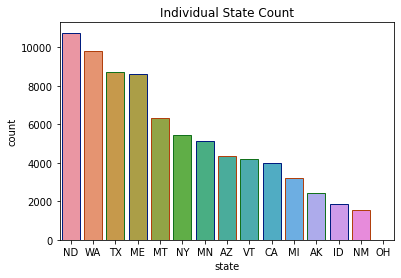

In [ ]:
sns.countplot(x = 'state',
              data = border_data,
              order = border_data['state'].value_counts().index,
              edgecolor=sns.color_palette("dark", 3))
plt.title('Individual State Count')

Text(0.5, 1.0, 'Inbound Frequency at Individual Borders')

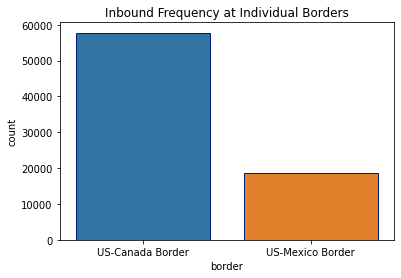

In [ ]:
sns.countplot(x = 'border',
              data = border_data,
              order = border_data['border'].value_counts().index,
              edgecolor=sns.color_palette("dark", 1))
plt.title('Inbound Frequency at Individual Borders')

In [ ]:
border_data['year'] = border_data['date'].transform(lambda x: x.year)

Text(0.5, 1.0, 'Year-wise Inbound Frequency')

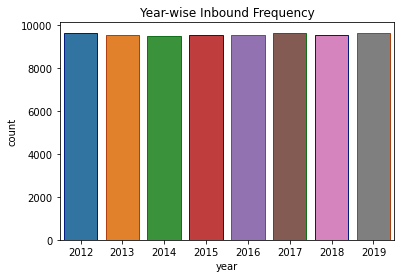

In [ ]:
sns.countplot(x = 'year',
            data = border_data, 
            edgecolor=sns.color_palette("dark", 3))
plt.title('Year-wise Inbound Frequency')

Text(0.5, 1.0, 'Frequency of Measures used by Inbound traffic')

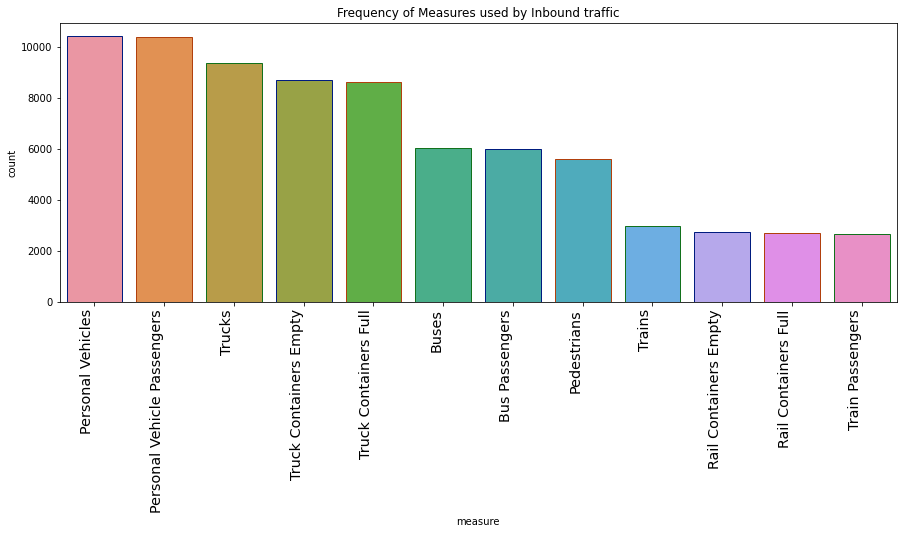

In [ ]:
plt.figure(figsize=(15,5))
sns.countplot(x = 'measure',
              data = border_data, order=border_data['measure'].value_counts().index,
              edgecolor=sns.color_palette("dark", 3))
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.subplots_adjust(hspace = 0.9, top = 0.9)
plt.title('Frequency of Measures used by Inbound traffic')

## Bivariate Analysis of the Data 

####Correlation matrix

In [ ]:
border_data_corr=border_data.corr()
border_data_corr

,port_code,value,year
port_code,1.000000,0.000526,0.001623
value,0.000526,1.000000,0.006104
year,0.001623,0.006104,1.000000


###HeatMap generation from correlation matrix

Text(0.5, 1.0, 'Correlation Between Port-Value-Year')

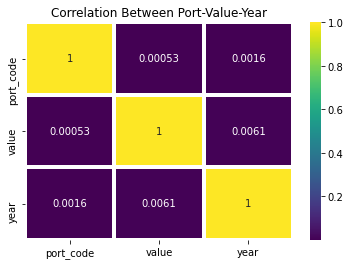

In [ ]:
sns.heatmap(border_data_corr,annot=True, cmap='viridis', linecolor ='white', linewidths=3)
plt.title('Correlation Between Port-Value-Year')

###Plot - Border vs State

In [ ]:
border_data_border = border_data.groupby(['border'])['state'].nunique().reset_index()

In [ ]:
border_data_border

,border,state
0,US-Canada Border,11
1,US-Mexico Border,4


Text(0.5, 1.0, 'State count in each Border')

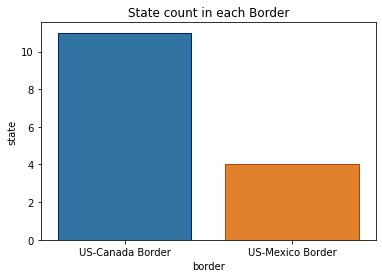

In [ ]:
sns.barplot(x = "border",y="state",data = border_data_border,
            edgecolor=sns.color_palette("dark", 3))
plt.title('State count in each Border')

###Plot - Border vs Port

In [ ]:
border_data_port = border_data.groupby(['border'])['port_name'].nunique().reset_index()

In [ ]:
border_data_port

,border,port_name
0,US-Canada Border,88
1,US-Mexico Border,27


Text(0.5, 1.0, 'Port count in each Border')

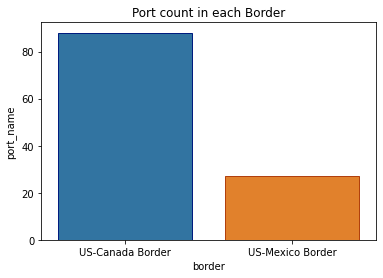

In [ ]:
sns.barplot(x = "border",y="port_name",data = border_data_port,
            edgecolor=sns.color_palette("dark", 3))
plt.title('Port count in each Border')

###Plot - State vs Port

In [ ]:
border_data_state_port = border_data.groupby(['state'])['port_name'].nunique().reset_index().sort_values('port_name')

Text(0.5, 1.0, 'Number of Port per State')

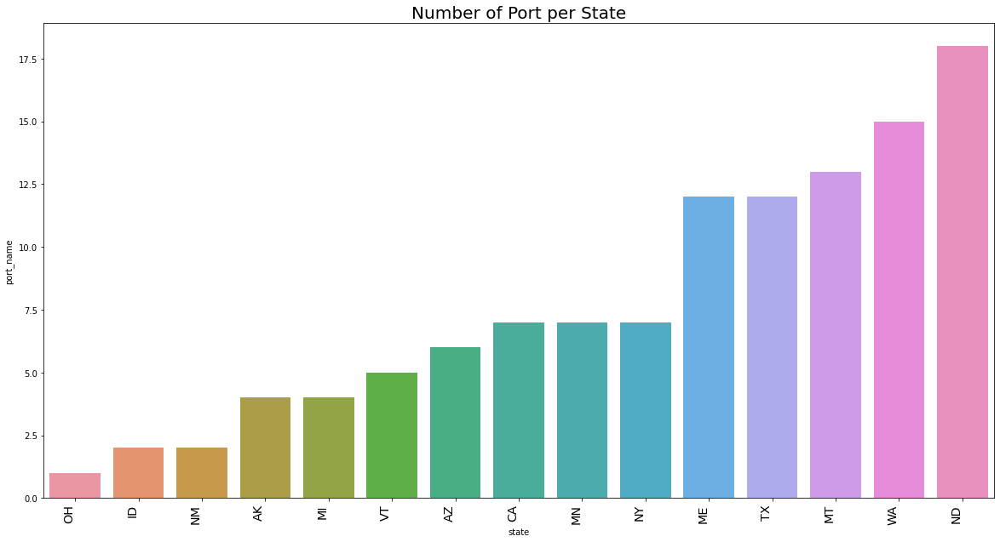

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(x = "state",y="port_name",data = border_data_state_port)
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.subplots_adjust(hspace = 0.9, top = 0.9)
plt.title('Number of Port per State',fontsize=20)

###Plot - State vs Measures

In [ ]:
border_data_state_measure = border_data.groupby(['state'])['measure'].count().reset_index().sort_values('measure')

Text(0.5, 1.0, 'Frequency of Measures per State')

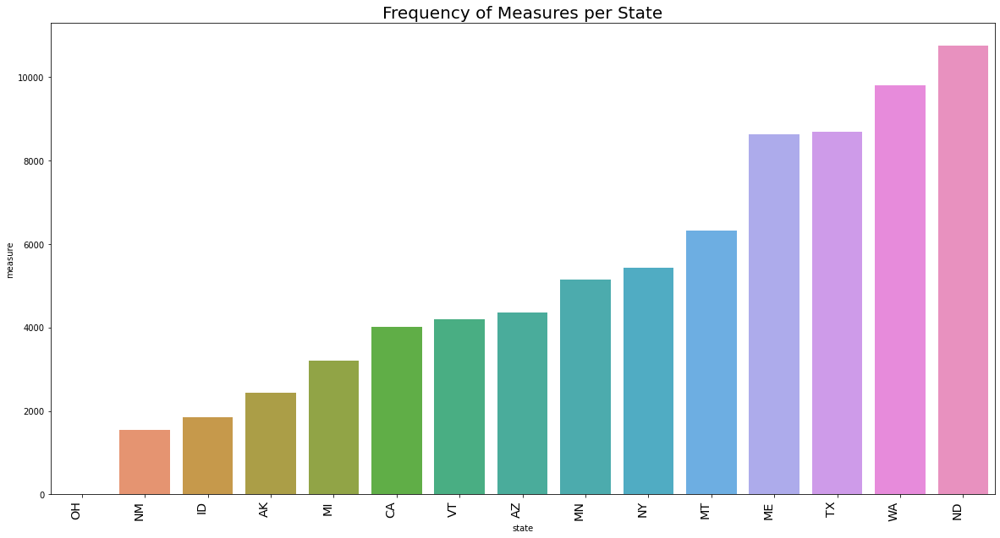

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(x = "state",y="measure",data = border_data_state_measure)
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.subplots_adjust(hspace = 0.9, top = 0.9)
plt.title('Frequency of Measures per State',fontsize=20)

###Plot - Measures vs Inbound Movement

In [ ]:
border_data_measure_values = border_data.groupby(['measure'])['value'].sum().reset_index().sort_values('value')

Text(0.5, 1.0, 'Number of Passengers per Measures')

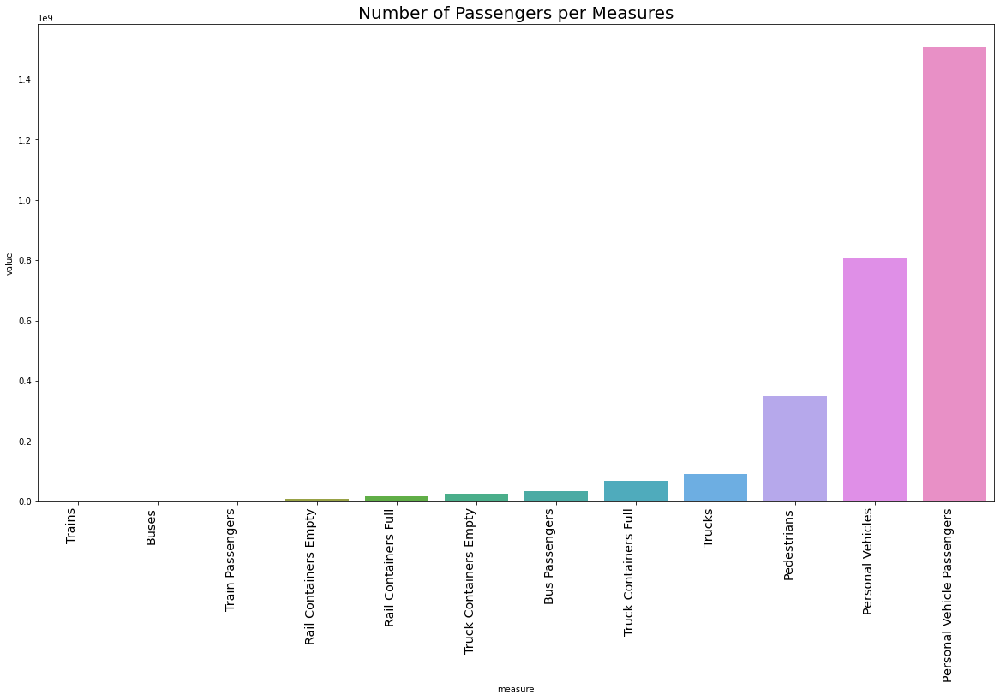

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(x = "measure",y="value",data = border_data_measure_values)
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.subplots_adjust(hspace = 0.9, top = 0.9)
plt.title('Number of Passengers per Measures',fontsize=20)


###Pie Chart

In [ ]:
people_measure = border_data[['measure','value']].groupby('measure').sum()
values = people_measure.values.flatten()
labels = people_measure.index
fig = go.Figure(data=[go.Pie(labels = labels, values=values)])
fig.update(layout_title_text='Total inbound persons, 2012-2019')
fig.show()



###Plot - Border vs Inbound Movement

In [ ]:
border_data_border_values = border_data.groupby(['border'])['value'].sum().reset_index().sort_values('value')

Text(0.5, 1.0, 'Number of passengers crossing each Border')

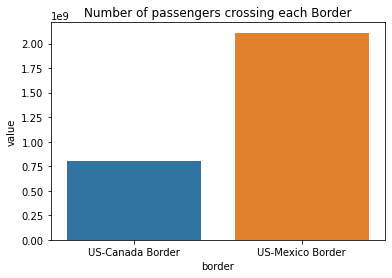

In [ ]:
sns.barplot(x = "border",y="value",data = border_data_border_values)
plt.title('Number of passengers crossing each Border')

###Plot - State vs Inbound Movement

In [ ]:
border_data_state_values = border_data.groupby(['state'])['value'].sum().reset_index().sort_values('value')

Text(0.5, 1.0, 'Number of Inbound passengers per State')

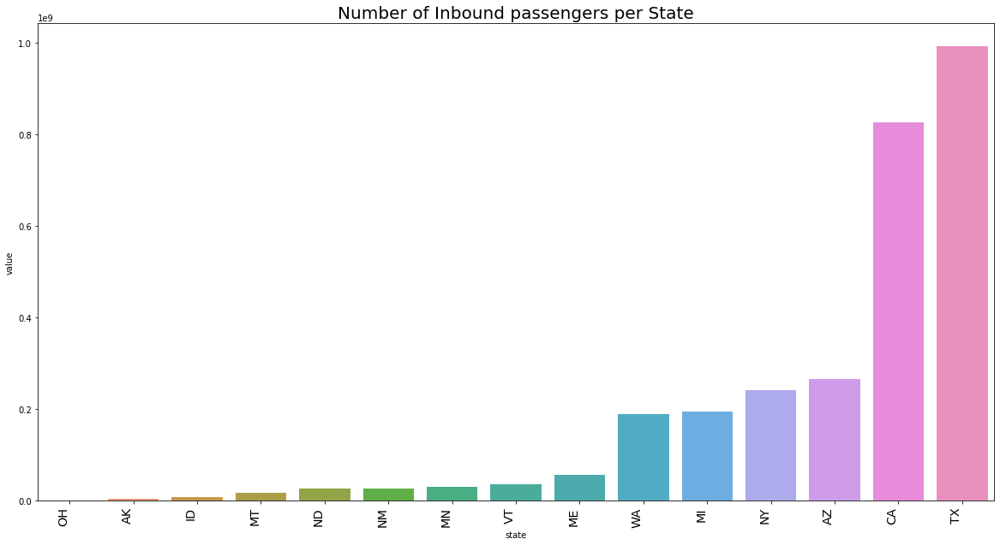

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(x = "state",y="value",data = border_data_state_values)
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.subplots_adjust(hspace = 0.9, top = 0.9)
plt.title('Number of Inbound passengers per State',fontsize=20)

###Pie Chart

In [ ]:
state_value = border_data[['state','value']].groupby('state').sum()
values = state_value.values.flatten()
labels = state_value.index
fig = go.Figure(data=[go.Pie(labels = labels, values=values)])
fig.update(layout_title_text='Total inbound persons in each state')
fig.show()

## Multivariate Analysis


####Analysis of both Borders

<Figure size 1440x720 with 0 Axes>

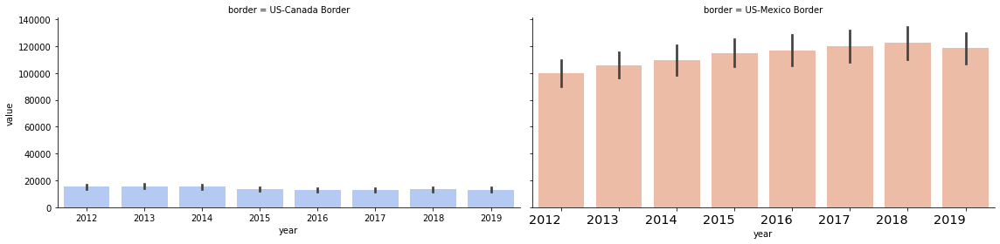

In [ ]:
plt.figure(figsize=(20,10))
g = sns.FacetGrid(border_data, col="border",size=4, aspect=2, hue ='border', palette ='coolwarm')
g.map(sns.barplot, "year", "value")
plt.xticks(
    rotation=0, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.subplots_adjust(hspace = 1, top = 0.9)

###Splitting the dataframe border wise

In [ ]:
border_data_canada = border_data[border_data['border']=='US-Canada Border']
border_data_mexico = border_data[border_data['border']=='US-Mexico Border']
border_data_mexico.head()

,port_name,state,port_code,border,date,measure,value,year
3,Brownsville,TX,2301,US-Mexico Border,2019-12-01,Bus Passengers,4668,2019
6,Calexico East,CA,2507,US-Mexico Border,2019-12-01,Bus Passengers,4080,2019
8,Columbus,NM,2406,US-Mexico Border,2019-12-01,Bus Passengers,1452,2019
11,Douglas,AZ,2601,US-Mexico Border,2019-12-01,Bus Passengers,107,2019
13,Eagle Pass,TX,2303,US-Mexico Border,2019-12-01,Bus Passengers,8525,2019


###Growth Rate Analysis

In [ ]:
border_data_canada_growth = border_data_canada.groupby(['year'])['value'].sum().reset_index()
border_data_mexico_growth = border_data_mexico.groupby(['year'])['value'].sum().reset_index()
border_data_canada_growth['growth_rate'] =border_data_canada_growth.value.pct_change()*100
border_data_mexico_growth['growth_rate'] =border_data_mexico_growth.value.pct_change()*100
border_data_canada_growth.fillna(0, inplace=True)
border_data_mexico_growth.fillna(0, inplace=True)

###Plot - US Canada Border - Growth Rate

Text(0.5, 1.0, 'Growth Rate per Year - Canada Border')

<Figure size 1440x720 with 0 Axes>

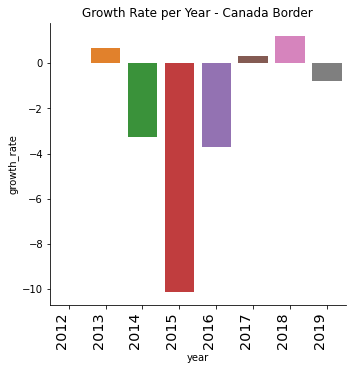

In [ ]:
plt.figure(figsize=(20,10))
sns.factorplot(x='year', y='growth_rate',data = border_data_canada_growth, kind = 'bar' )
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.subplots_adjust(hspace = 1, top = 0.9)
plt.title("Growth Rate per Year - Canada Border")

###Plot - US Mexico Border - Growth Rate

Text(0.5, 1.0, 'Growth Rate per Year - Mexico Border')

<Figure size 1440x720 with 0 Axes>

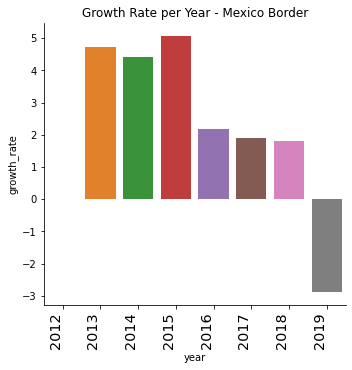

In [ ]:
plt.figure(figsize=(20,10))
sns.factorplot(x='year', y='growth_rate',data = border_data_mexico_growth, kind = 'bar' )
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.subplots_adjust(hspace = 1, top = 0.9)
plt.title("Growth Rate per Year - Mexico Border")

###Passenger count Analysis

Text(0.5, 1.0, 'Measure VS Passenger Count - Border Wise')

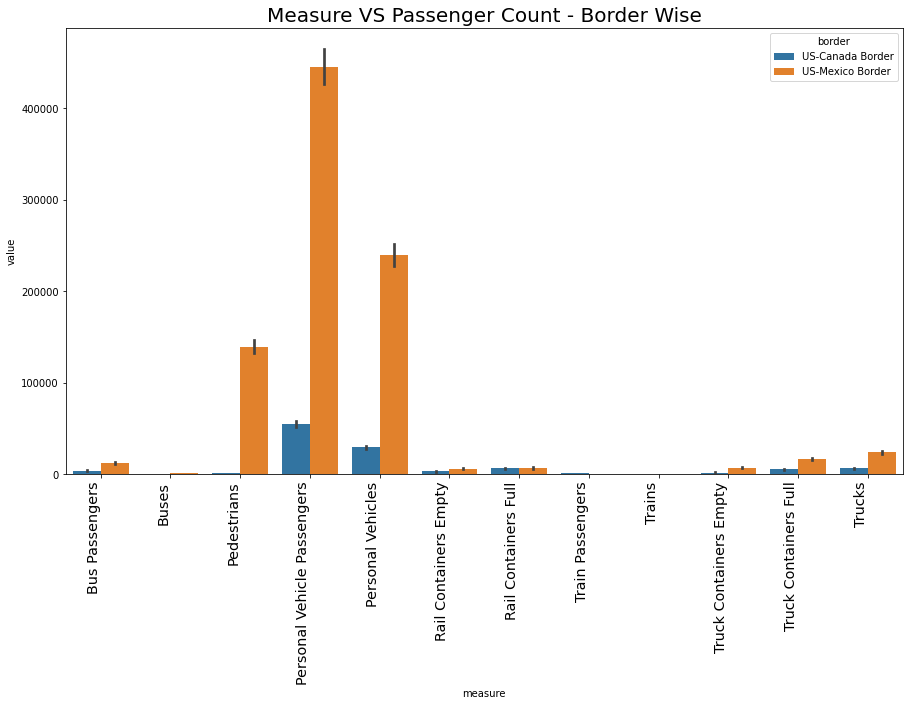

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(x='measure', y='value', data=border_data,hue='border')

plt.subplots_adjust(hspace = 0.9, top = 0.9)
plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.title('Measure VS Passenger Count - Border Wise', fontsize=20)

In [ ]:
border_data['month'] = border_data.date.apply(lambda x: x.month)
border_data_canada['month'] = border_data_canada.date.apply(lambda x:x.month)
border_data_mexico['month']= border_data_mexico.date.apply(lambda x:x.month)

In [ ]:
border_data.head()

,port_name,state,port_code,border,date,measure,value,year,month
0,Alexandria Bay,NY,708,US-Canada Border,2019-12-01,Bus Passengers,740,2019,12
1,Baudette,MN,3424,US-Canada Border,2019-12-01,Bus Passengers,83,2019,12
2,Blaine,WA,3004,US-Canada Border,2019-12-01,Bus Passengers,17029,2019,12
3,Brownsville,TX,2301,US-Mexico Border,2019-12-01,Bus Passengers,4668,2019,12
4,Buffalo-Niagara Falls,NY,901,US-Canada Border,2019-12-01,Bus Passengers,9910,2019,12


###Pivot table Analysis

In [ ]:
border_data_canada_pivot = pd.pivot_table(border_data_canada,values ='value',columns='measure',index='year',aggfunc='count')
border_data_mexico_pivot = pd.pivot_table(border_data_mexico,values ='value',columns='measure',index='year',aggfunc='count')

In [ ]:
border_data_canada_pivot.head()

measure,Bus Passengers,Buses,Pedestrians,Personal Vehicle Passengers,Personal Vehicles,Rail Containers Empty,Rail Containers Full,Train Passengers,Trains,Truck Containers Empty,Truck Containers Full,Trucks
year,,,,,,,,,,,,
2012,561,564,403,1007,1007,249,260,292,293,865,849,945
2013,557,563,401,994,993,241,253,284,291,842,841,934
2014,560,560,389,1004,990,243,246,294,295,819,827,936
2015,549,558,388,1003,1002,258,264,305,305,809,813,946
2016,565,566,390,1004,1003,273,273,306,306,784,785,919


###Pivot table Analysis - US Canada Border

In [ ]:
border_data_canada_pivot_1 = border_data_canada_pivot.reset_index()[border_data_canada_pivot.reset_index().year.isin(['2012','2013','2014','2015'])]
border_data_canada_pivot_2 = border_data_canada_pivot.reset_index()[border_data_canada_pivot.reset_index().year.isin(['2016','2017','2018','2019'])]

In [ ]:
border_data_canada_pivot_1 = border_data_canada_pivot_1.set_index('year')
border_data_canada_pivot_1

measure,Bus Passengers,Buses,Pedestrians,Personal Vehicle Passengers,Personal Vehicles,Rail Containers Empty,Rail Containers Full,Train Passengers,Trains,Truck Containers Empty,Truck Containers Full,Trucks
year,,,,,,,,,,,,
2012,561,564,403,1007,1007,249,260,292,293,865,849,945
2013,557,563,401,994,993,241,253,284,291,842,841,934
2014,560,560,389,1004,990,243,246,294,295,819,827,936
2015,549,558,388,1003,1002,258,264,305,305,809,813,946


In [ ]:
border_data_canada_pivot_2 = border_data_canada_pivot_2.set_index('year')
border_data_canada_pivot_2

measure,Bus Passengers,Buses,Pedestrians,Personal Vehicle Passengers,Personal Vehicles,Rail Containers Empty,Rail Containers Full,Train Passengers,Trains,Truck Containers Empty,Truck Containers Full,Trucks
year,,,,,,,,,,,,
2016,565,566,390,1004,1003,273,273,306,306,784,785,919
2017,534,536,389,997,1000,276,276,284,281,901,875,927
2018,523,522,376,1000,1017,271,271,276,273,901,868,921
2019,526,529,406,1000,1017,277,276,282,274,905,867,913


###HeatMap Analysis

####US Canada Border - (2012-2015)

Text(0.5, 1.0, "Heatmap - Measure's frequency - Canada Border(2012-2015)")

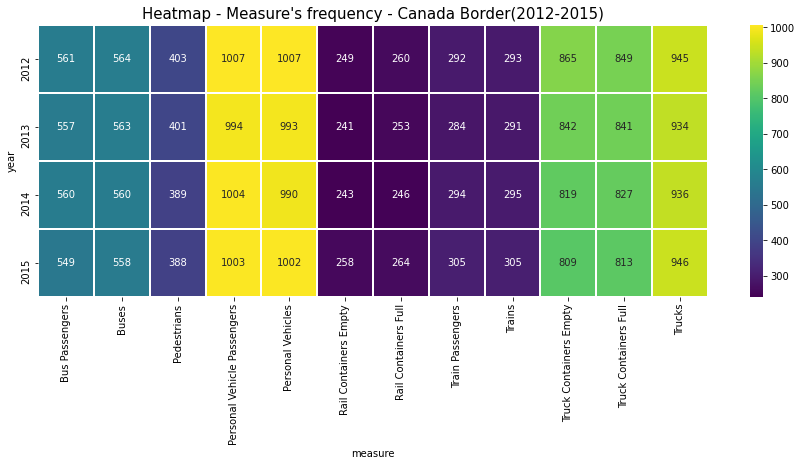

In [ ]:
plt.figure(figsize=(15,5))
sns.heatmap(border_data_canada_pivot_1,annot=True, cmap='viridis', linecolor ='white', linewidths=1, fmt='g')
plt.title("Heatmap - Measure's frequency - Canada Border(2012-2015)", fontsize=15)

####US Canada Border - (2016-2019)

Text(0.5, 1.0, "Heatmap - Measure's frequency - Canada Border(2016-2019)")

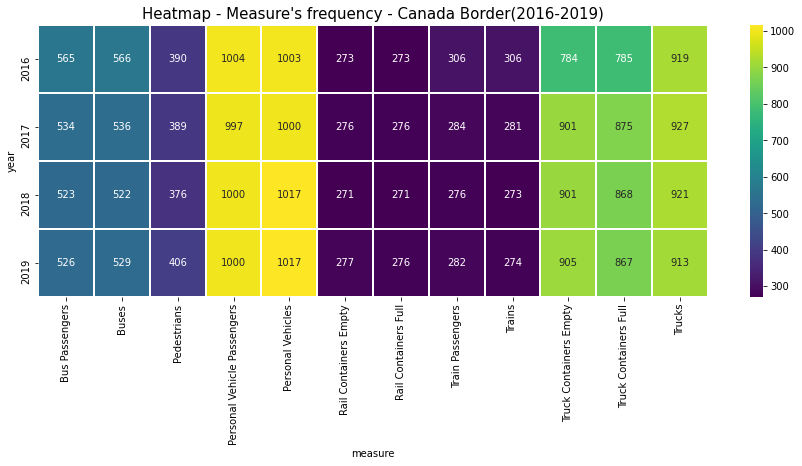

In [ ]:
plt.figure(figsize=(15,5))
sns.heatmap(border_data_canada_pivot_2,annot=True, cmap='viridis', linecolor ='white', linewidths=1, fmt='g')
plt.title("Heatmap - Measure's frequency - Canada Border(2016-2019)", fontsize=15)

###Pivot table Analysis - US Mexico Border

In [ ]:
border_data_mexico_pivot_1 = border_data_mexico_pivot.reset_index()[border_data_mexico_pivot.reset_index().year.isin(['2012','2013','2014','2015'])]
border_data_mexico_pivot_2 = border_data_mexico_pivot.reset_index()[border_data_mexico_pivot.reset_index().year.isin(['2016','2017','2018','2019'])]

In [ ]:
border_data_mexico_pivot_1 = border_data_mexico_pivot_1.set_index('year')
border_data_mexico_pivot_2 = border_data_mexico_pivot_2.set_index('year')

###HeatMap Analysis

####US Mexico Border - (2012-2015)

Text(0.5, 1.0, "Heatmap - Measure's frequency - Mexico Border(2012-2015)")

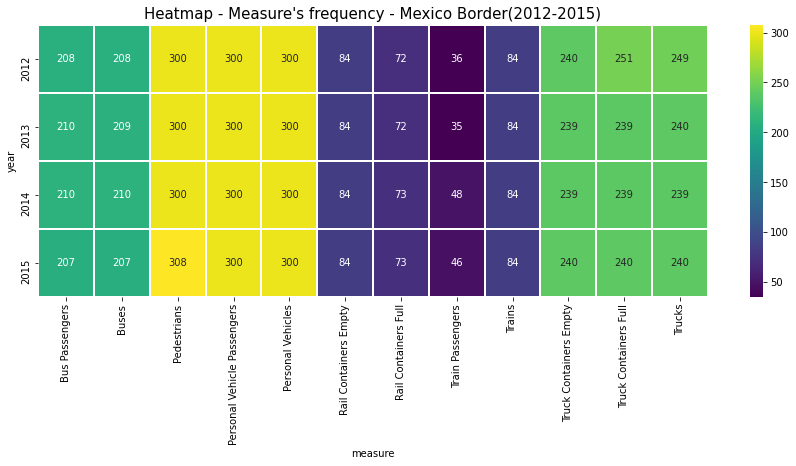

In [ ]:
plt.figure(figsize=(15,5))
sns.heatmap(border_data_mexico_pivot_1,annot=True, cmap='viridis', linecolor ='white', linewidths=1, fmt='g')
plt.title("Heatmap - Measure's frequency - Mexico Border(2012-2015)", fontsize=15)

####US Mexico Border - (2016-2019)

Text(0.5, 1.0, "Heatmap - Measure's frequency - Mexico Border(2016-2019)")

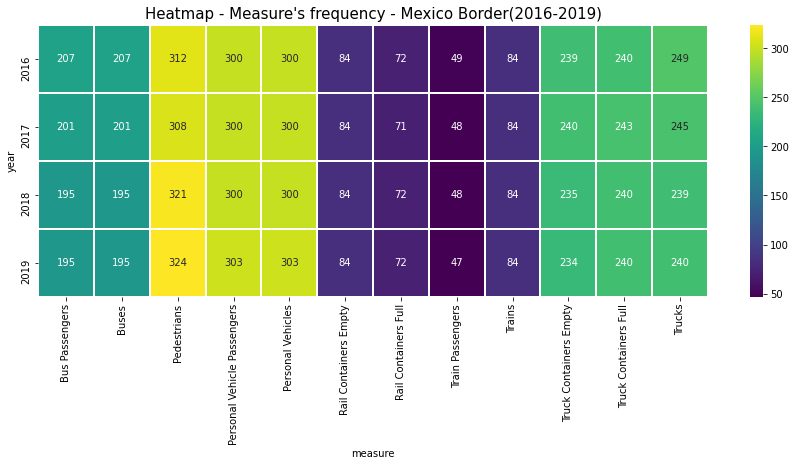

In [ ]:
plt.figure(figsize=(15,5))
sns.heatmap(border_data_mexico_pivot_2,annot=True, cmap='viridis', linecolor ='white', linewidths=1, fmt='g')
plt.title("Heatmap - Measure's frequency - Mexico Border(2016-2019)", fontsize=15)

### Inbound Passenger monthly Analysis - US Canada Border

In [ ]:
border_data_canada_total = border_data_canada.groupby('month').value.sum().reset_index()

In [ ]:
border_data_canada_total

,month,value
0,1,52594964
1,2,50066757
2,3,61563549
3,4,61002674
4,5,69193220
5,6,75449796
6,7,89531876
7,8,93407838
8,9,69747223
9,10,66290537


Text(0.5, 1.0, 'Month wise cumulative Inbound passengers count-Canada Border')

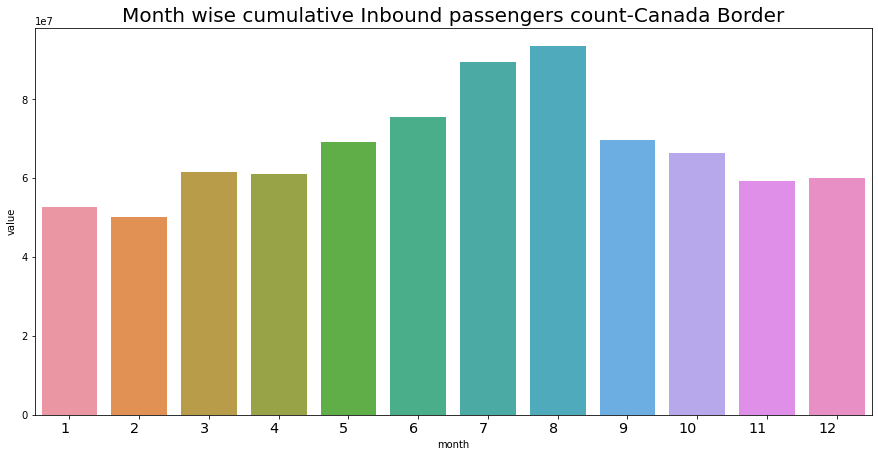

In [ ]:
plt.figure(figsize=(15,5))
sns.barplot(x='month', y='value', data= border_data_canada_total)
plt.subplots_adjust(hspace=0.9 ,top = 1.2)
plt.xticks(
    rotation=0, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.title("Month wise cumulative Inbound passengers count-Canada Border",fontsize=20)

### Inbound Passenger monthly Analysis - US Mexico Border

In [ ]:
border_data_mexico_total = border_data_mexico.groupby('month').value.sum().reset_index()

In [ ]:
border_data_mexico_total

,month,value
0,1,173812029
1,2,158374294
2,3,180951984
3,4,173725702
4,5,177974128
5,6,171258155
6,7,181579601
7,8,179420444
8,9,169028512
9,10,178520140


Text(0.5, 1.0, 'Month wise cumulative Inbound passengers count-Mexico Border')

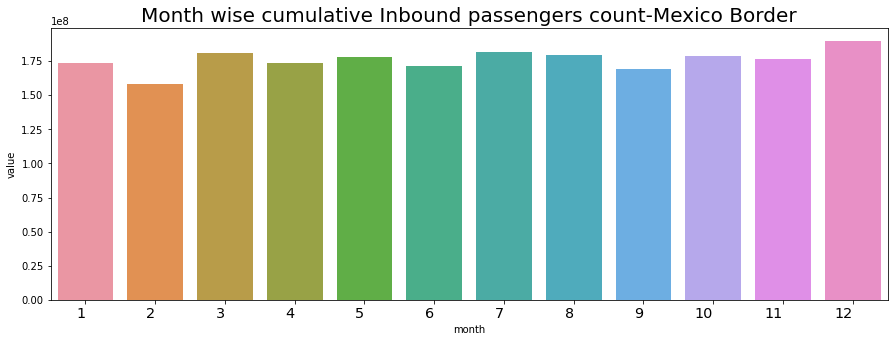

In [ ]:
plt.figure(figsize=(15,5))
sns.barplot(x='month', y='value', data= border_data_mexico_total)
plt.xticks(
    rotation=0, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large')
plt.title("Month wise cumulative Inbound passengers count-Mexico Border",fontsize=20)

## Before and after Trump comparison of trade and tourism country wise

In [ ]:
border_data['measure'].unique()

array(['Bus Passengers', 'Buses', 'Pedestrians',
       'Personal Vehicle Passengers', 'Personal Vehicles',
       'Rail Containers Empty', 'Rail Containers Full',
       'Train Passengers', 'Trains', 'Truck Containers Empty',
       'Truck Containers Full', 'Trucks'], dtype=object)

In [ ]:
commercial =['Rail Containers Empty','Rail Containers Full','Truck Containers Empty','Truck Containers Full','Trucks']

In [ ]:
personal=['Bus Passengers','Buses','Pedestrians','Personal Vehicle Passengers','Personal Vehicles','Train Passengers','Train']

In [ ]:
df_trade=border_data[border_data['measure'].isin(commercial)]

In [ ]:
df_people=border_data[border_data['measure'].isin(personal)]

In [ ]:
trade=df_trade.groupby(['border','year']).agg({'value':sum}).reset_index()
trade.head()

,border,year,value
0,US-Canada Border,2012,13146367
1,US-Canada Border,2013,13391176
2,US-Canada Border,2014,13807503
3,US-Canada Border,2015,13992848
4,US-Canada Border,2016,14013905


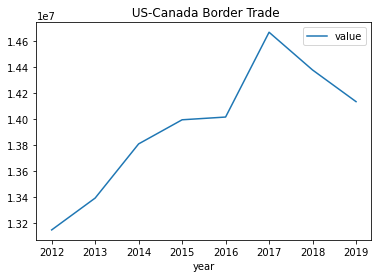

In [ ]:
trade[trade['border']=='US-Canada Border'].plot(x='year',y='value',title=" US-Canada Border Trade")

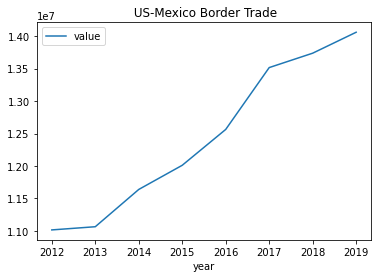

In [ ]:
trade[trade['border']=='US-Mexico Border'].plot(x='year',y='value',title=" US-Mexico Border Trade")

In [ ]:
people=df_people.groupby(['border','year']).agg({'value':sum}).reset_index()

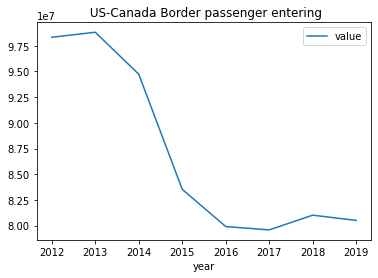

In [ ]:
people[people['border']=='US-Canada Border'].plot(x='year',y='value',title=" US-Canada Border passenger entering")

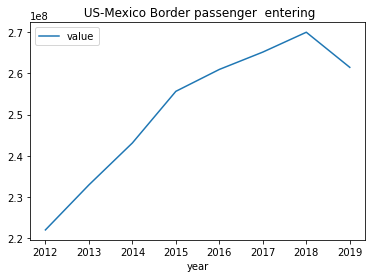

In [ ]:
people[people['border']=='US-Mexico Border'].plot(x='year',y='value',title=" US-Mexico Border passenger  entering")

###Inbound Trade

In [ ]:
trade_list =['Rail Containers Empty','Rail Containers Full','Truck Containers Empty','Truck Containers Full']

In [ ]:
trade2=df_trade[df_trade['measure'].isin(trade_list)]

In [ ]:
trade22=trade2.groupby(['border','year','measure']).agg({'value':sum}).reset_index()

Text(0.5, 1.0, 'Comparison of Mode of Trade between USA and Canada')

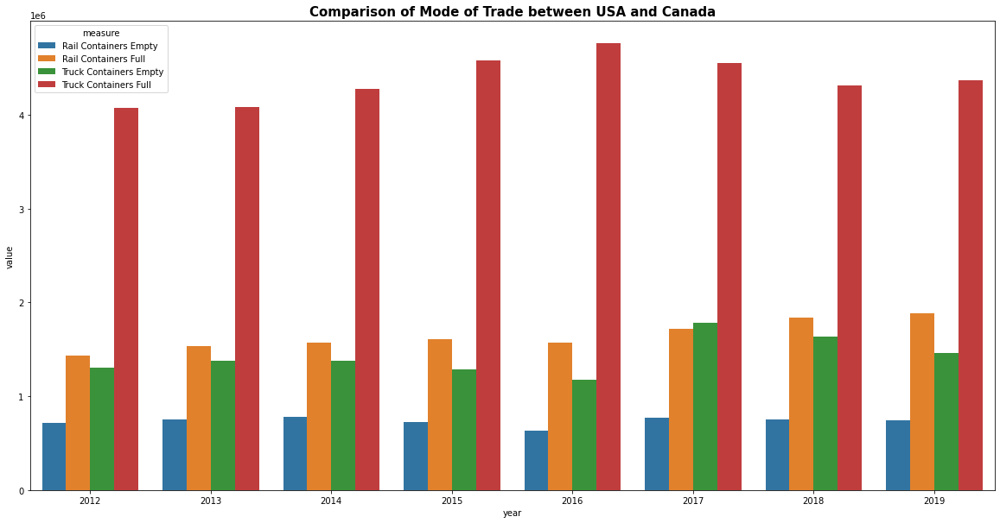

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(data=trade22[trade22['border']=='US-Canada Border'], x="year", y="value", hue="measure")
plt.title("Comparison of Mode of Trade between USA and Canada", fontweight='bold', fontsize=15)

Text(0.5, 1.0, 'Comparison of Mode of Trade between USA and Mexico')

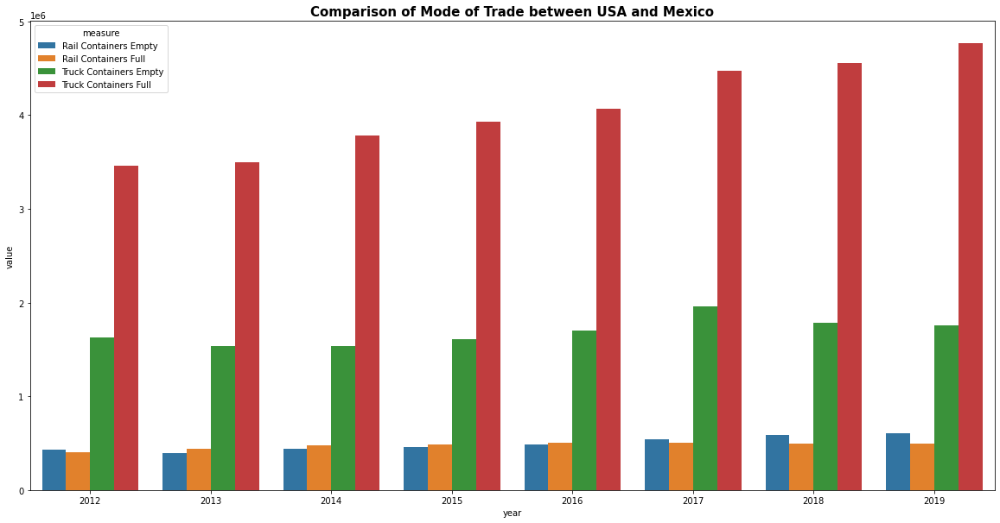

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(data=trade22[trade22['border']=='US-Mexico Border'], x="year", y="value", hue="measure")
plt.title("Comparison of Mode of Trade between USA and Mexico", fontweight='bold', fontsize=15)

###Pivot Table Analysis

####State vs Measure - Inbound Movement

In [ ]:
statewise_measure_value = pd.pivot_table(border_data, values='value', index='state', columns='measure', aggfunc = np.sum)

In [ ]:
statewise_measure_value.fillna(0,inplace=True)
statewise_measure_value

measure,Bus Passengers,Buses,Pedestrians,Personal Vehicle Passengers,Personal Vehicles,Rail Containers Empty,Rail Containers Full,Train Passengers,Trains,Truck Containers Empty,Truck Containers Full,Trucks
state,,,,,,,,,,,,
AK,1488394.0,99631.0,25700.0,2002687.0,874876.0,0.0,0.0,710881.0,2337.0,45649.0,56676.0,72730.0
AZ,1638072.0,101907.0,55282340.0,131875725.0,69193036.0,265644.0,307243.0,23527.0,5942.0,703887.0,2557678.0,3143463.0
CA,4149441.0,659880.0,147189990.0,417584602.0,235833828.0,79618.0,3693.0,5490.0,4056.0,3210101.0,7058863.0,10153264.0
ID,33961.0,907.0,20355.0,3680584.0,1913121.0,57270.0,891380.0,19754.0,9806.0,138632.0,417508.0,531204.0
ME,214205.0,6198.0,138117.0,31195305.0,19908312.0,184295.0,164610.0,16435.0,8492.0,959346.0,1407169.0,2427100.0
MI,2265105.0,168923.0,112551.0,95340424.0,53217232.0,1960724.0,2973088.0,126353.0,47659.0,4489168.0,15141048.0,19092785.0
MN,237046.0,14360.0,106440.0,14550901.0,8807040.0,1265565.0,4290543.0,119119.0,57843.0,221050.0,260911.0,468173.0
MT,105673.0,3601.0,36889.0,9854963.0,5303417.0,104266.0,144136.0,18179.0,3086.0,291575.0,1080272.0,1358095.0
ND,333999.0,11051.0,24387.0,11171448.0,5730244.0,944382.0,2374801.0,64855.0,25195.0,880904.0,2408220.0,3163381.0


In [ ]:
list1=border_data['state'].unique().tolist()
list1

['NY',
 'MN',
 'WA',
 'TX',
 'ME',
 'CA',
 'NM',
 'VT',
 'MI',
 'AZ',
 'ND',
 'MT',
 'AK',
 'ID',
 'OH']

In [ ]:
state_measure=border_data.groupby(['state','measure']).agg({'value':sum}).reset_index()

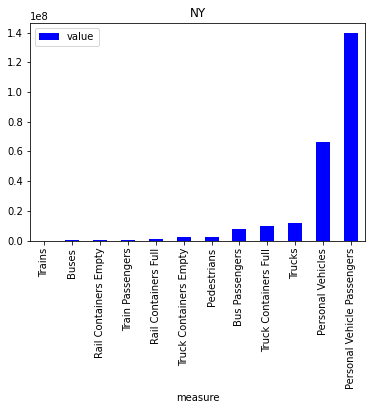

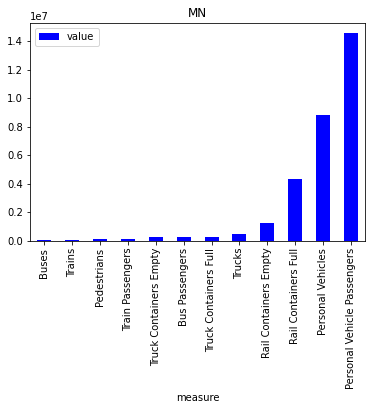

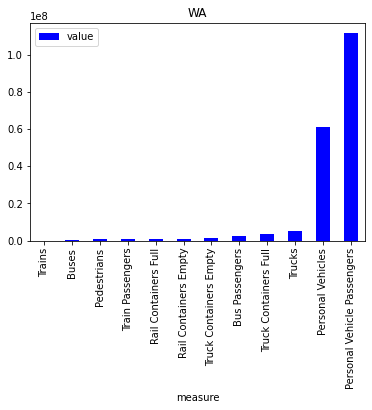

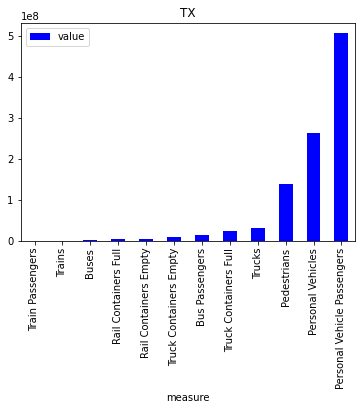

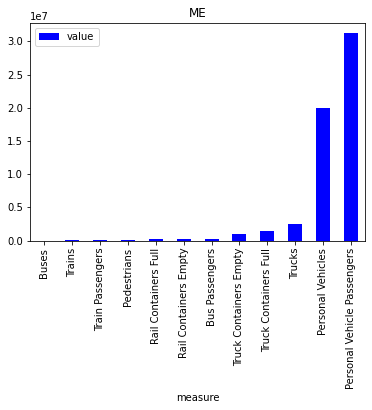

...

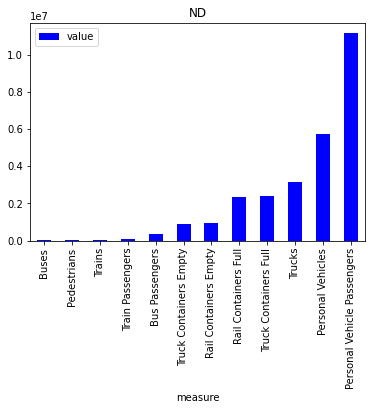

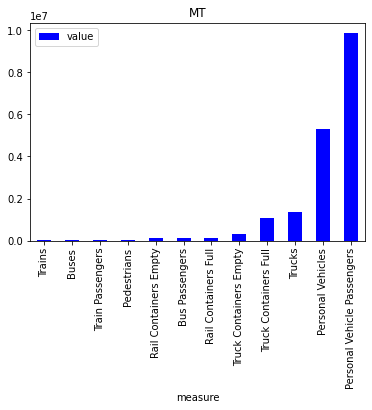

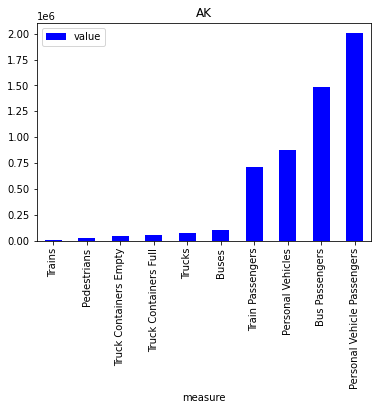

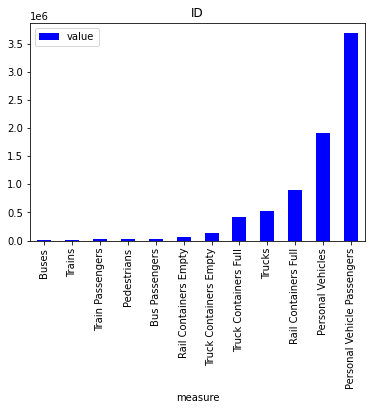

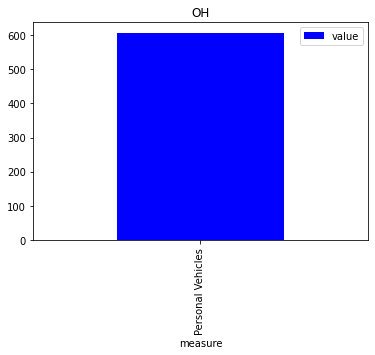

In [ ]:
for i in list1:
    state_measure[state_measure['state']==i].sort_values(by='value').plot(x='measure',y='value',kind='bar',color='blue',title=i)

In [ ]:
statewise_measure_value_canada = pd.pivot_table(border_data_canada, values='value', index='state', columns='measure', aggfunc = np.sum)

In [ ]:
statewise_measure_value_canada.fillna(0,inplace=True)

In [ ]:
statewise_measure_value_canada

measure,Bus Passengers,Buses,Pedestrians,Personal Vehicle Passengers,Personal Vehicles,Rail Containers Empty,Rail Containers Full,Train Passengers,Trains,Truck Containers Empty,Truck Containers Full,Trucks
state,,,,,,,,,,,,
AK,1488394.0,99631.0,25700.0,2002687.0,874876.0,0.0,0.0,710881.0,2337.0,45649.0,56676.0,72730.0
ID,33961.0,907.0,20355.0,3680584.0,1913121.0,57270.0,891380.0,19754.0,9806.0,138632.0,417508.0,531204.0
ME,214205.0,6198.0,138117.0,31195305.0,19908312.0,184295.0,164610.0,16435.0,8492.0,959346.0,1407169.0,2427100.0
MI,2265105.0,168923.0,112551.0,95340424.0,53217232.0,1960724.0,2973088.0,126353.0,47659.0,4489168.0,15141048.0,19092785.0
MN,237046.0,14360.0,106440.0,14550901.0,8807040.0,1265565.0,4290543.0,119119.0,57843.0,221050.0,260911.0,468173.0
MT,105673.0,3601.0,36889.0,9854963.0,5303417.0,104266.0,144136.0,18179.0,3086.0,291575.0,1080272.0,1358095.0
ND,333999.0,11051.0,24387.0,11171448.0,5730244.0,944382.0,2374801.0,64855.0,25195.0,880904.0,2408220.0,3163381.0
NY,7839030.0,262014.0,2596009.0,139355095.0,66170991.0,399159.0,1371338.0,527493.0,32112.0,2406807.0,9480708.0,12114991.0
OH,0.0,0.0,0.0,0.0,607.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
max_statewise_measure_value_canada = statewise_measure_value_canada.idxmax(axis=1)

In [ ]:
max_statewise_measure_value_canada

state
AK    Personal Vehicle Passengers
ID    Personal Vehicle Passengers
ME    Personal Vehicle Passengers
MI    Personal Vehicle Passengers
MN    Personal Vehicle Passengers
MT    Personal Vehicle Passengers
ND    Personal Vehicle Passengers
NY    Personal Vehicle Passengers
OH              Personal Vehicles
VT    Personal Vehicle Passengers
WA    Personal Vehicle Passengers
dtype: object

In [ ]:
min_statewise_measure_value_canada = statewise_measure_value_canada.idxmin(axis=1)
min_statewise_measure_value_canada

state
AK    Rail Containers Empty
ID                    Buses
ME                    Buses
MI                   Trains
MN                    Buses
MT                   Trains
ND                    Buses
NY                   Trains
OH           Bus Passengers
VT                   Trains
WA                   Trains
dtype: object

In [ ]:
statewise_measure_value_mexico = pd.pivot_table(border_data_mexico, values='value', index='state', columns='measure', aggfunc = np.sum)

In [ ]:
statewise_measure_value_mexico.fillna(0,inplace=True)
statewise_measure_value_mexico


measure,Bus Passengers,Buses,Pedestrians,Personal Vehicle Passengers,Personal Vehicles,Rail Containers Empty,Rail Containers Full,Train Passengers,Trains,Truck Containers Empty,Truck Containers Full,Trucks
state,,,,,,,,,,,,
AZ,1638072.0,101907.0,55282340.0,131875725.0,69193036.0,265644.0,307243.0,23527.0,5942.0,703887.0,2557678.0,3143463.0
CA,4149441.0,659880.0,147189990.0,417584602.0,235833828.0,79618.0,3693.0,5490.0,4056.0,3210101.0,7058863.0,10153264.0
NM,149282.0,12419.0,3417363.0,14917228.0,7097685.0,0.0,0.0,0.0,0.0,278864.0,668104.0,940513.0
TX,13082742.0,730444.0,138971247.0,505686576.0,263572431.0,3599191.0,3486843.0,44284.0,72749.0,9309362.0,22234534.0,31605202.0


In [ ]:
max_statewise_measure_value_mexico = statewise_measure_value_mexico.idxmax(axis=1)
max_statewise_measure_value_mexico

state
AZ    Personal Vehicle Passengers
CA    Personal Vehicle Passengers
NM    Personal Vehicle Passengers
TX    Personal Vehicle Passengers
dtype: object

In [ ]:
min_statewise_measure_value_mexico = statewise_measure_value_mexico.idxmin(axis=1)
min_statewise_measure_value_mexico

state
AZ                   Trains
CA     Rail Containers Full
NM    Rail Containers Empty
TX         Train Passengers
dtype: object

In [ ]:
#Plot doesn't run in Colab we have done it in Jupyter notebook
"""import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected = True)
state=border_data.groupby('state').agg({'value':sum}).reset_index()
state=state[['state','value']]

#Plot 1
data = dict(type = 'choropleth', 
  
            # location: Arizoana, California, Newyork 
            locations = state['state'], 
              
            # States of USA 
            locationmode = 'USA-states', 
              
            # colorscale can be added as per requirement 
            colorscale = 'Portland', 
              
            # text can be given anything you like 
            text = state['state'], 
            z = state['value'], 
            colorbar = {'title': 'state crossing count'})

layout = dict(geo ={'scope': 'usa'}) 
choromap = go.Figure(data = [data], layout = layout) 
iplot(choromap)

##Plot 2

people2=df_people.groupby(['border','state']).agg({'value':sum}).reset_index()

data = dict(type = 'choropleth', 
  
            # location: Arizoana, California, Newyork 
            locations = state['state'], 
              
            # States of USA 
            locationmode = 'USA-states', 
              
            # colorscale can be added as per requirement 
            colorscale = 'Portland', 
              
            # text can be given anything you like 
            text = people2['state'], 
            z = people['value'], 
            colorbar = {'title': 'state people crossing count'})

layout = dict(geo ={'scope': 'usa'}) 
choromap = go.Figure(data = [data], layout = layout) 
iplot(choromap)"""


##Thank You
_____________________________________________________